# Azure OpenAI Batch on url images

The Azure OpenAI Batch API is designed to handle large-scale and high-volume processing tasks efficiently. P**rocess asynchronous groups of requests with separate quota, with 24-hour target turnaround, at 50% less cost than global standard.** With batch processing, rather than send one request at a time you send a large number of requests in a single file. Global batch requests have a separate enqueued token quota avoiding any disruption of your online workloads.

Key use cases include:
- Large-Scale Data Processing: Quickly analyze extensive datasets in parallel.
- Content Generation: Create large volumes of text, such as product descriptions or articles.
- Document Review and Summarization: Automate the review and summarization of lengthy documents.
- Customer Support Automation: Handle numerous queries simultaneously for faster responses.
- Data Extraction and Analysis: Extract and analyze information from vast amounts of unstructured data.
- Natural Language Processing (NLP) Tasks: Perform tasks like sentiment analysis or translation on large datasets.
- Marketing and Personalization: Generate personalized content and recommendations at scale.

https://learn.microsoft.com/en-us/azure/ai-services/openai/how-to/batch


In [1]:
import datetime
import json
import openai
import os
import requests
import sys
import time

from dotenv import load_dotenv
from openai import AzureOpenAI
from io import BytesIO
from PIL import Image

In [2]:
print(f"Python version: {sys.version}")
print(f"OpenAI version: {openai.__version__}")

Python version: 3.10.11 (main, May 16 2023, 00:28:57) [GCC 11.2.0]
OpenAI version: 1.43.0


In [3]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 06-Sep-2024 08:59:49


## Settings

In [4]:
load_dotenv("azure.env")

# Azure OpenAI
AZURE_OPENAI_API_ENDPOINT: str = os.getenv("AZURE_OPENAI_API_ENDPOINT")
AZURE_OPENAI_API_KEY: str = os.getenv("AZURE_OPENAI_API_KEY")

AOAI_BATCH_MODEL: str = "gpt-4o-batch"

In [5]:
JSONL_DIR = "jsonl"
RESULTS_DIR = "results"

os.makedirs(JSONL_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

## Creating some prompts

In [6]:
# Template for the JSONL content
template = {
    "custom_id": "request-{}",
    "method": "POST",
    "url": "/chat/completions",
    "body": {
        "model":
        AOAI_BATCH_MODEL,
        "messages": [{
            "role": "system",
            "content": "You are an AI helpful assistant."
        }, {
            "role":
            "user",
            "content": [{
                "type": "text",
                "text": "Describe this image"
            }, {
                "type": "image_url",
                "image_url": {
                    "url": ""
                }
            }]
        }],
        "max_tokens":
        2000
    }
}

In [7]:
images_urls = [
    "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/arc_triomphe.jpg",
    "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/office.jpg",
    "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/car2.jpg",
    "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/presentation.png",
]

In [8]:
%%javascript Python 
OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

## Images

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/arc_triomphe.jpg


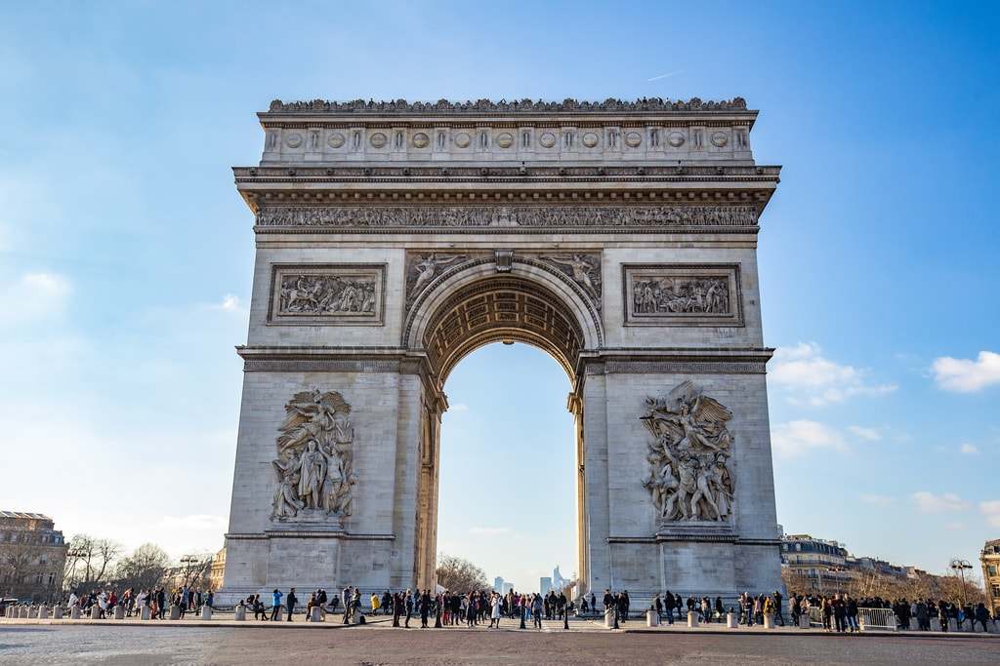

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/office.jpg


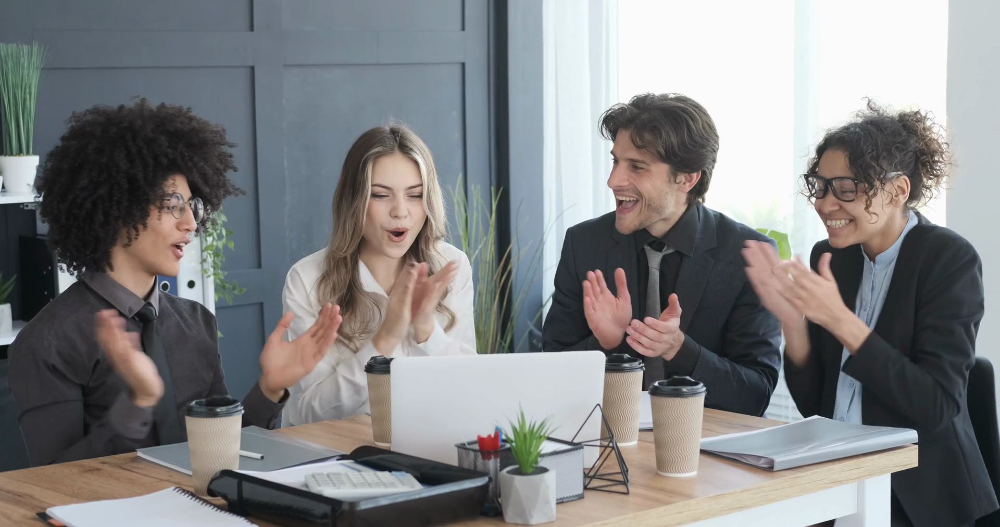

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/car2.jpg


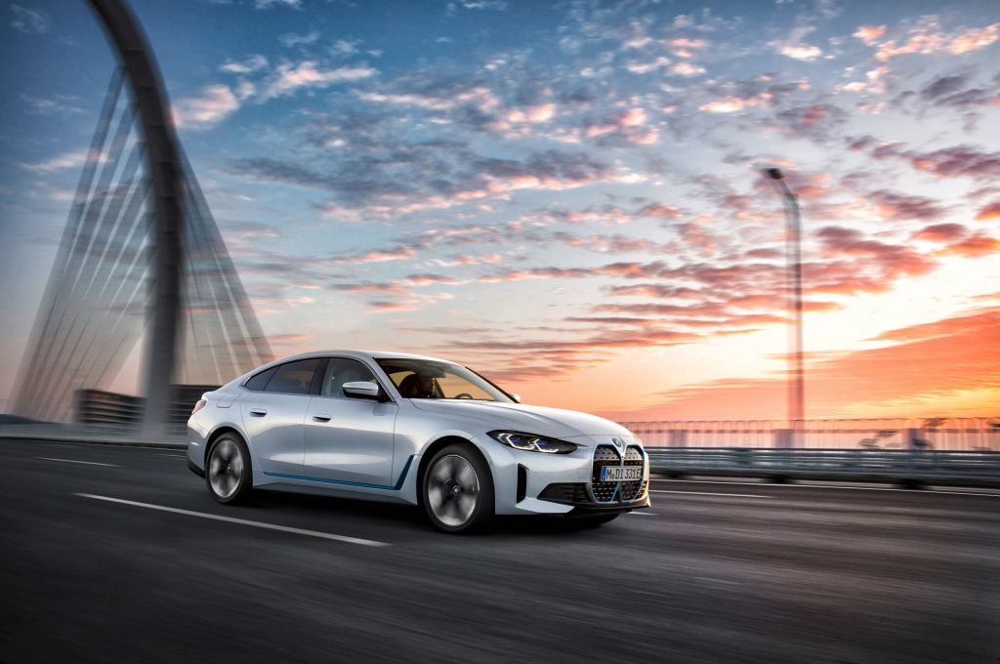

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/presentation.png


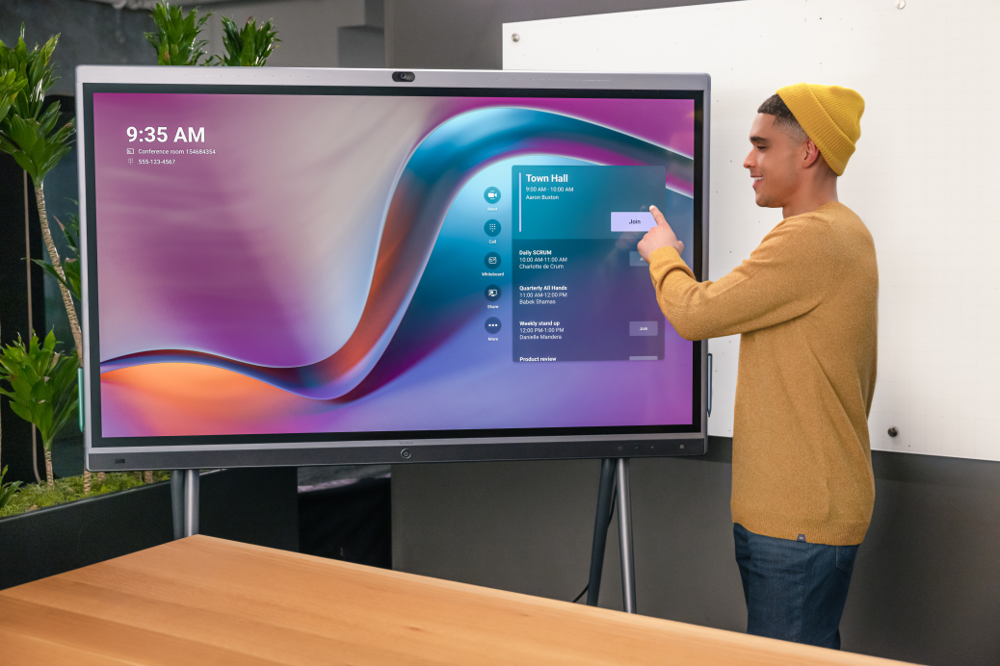

In [9]:
for url in images_urls:
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    print(f"Image url: {url}")
    display(img)

## Creating the jsonl input file for batch

In [10]:
# File to create
jsonlfile = os.path.join(JSONL_DIR, "batch_url_images.jsonl")

In [11]:
def create_jsonl_content(image_url, request_id):
    """
    Create jsonl content for batch
    """
    template = {
        "custom_id": f"request-{request_id}",
        "method": "POST",
        "url": "/chat/completions",
        "body": {
            "model":
            AOAI_BATCH_MODEL,
            "messages": [{
                "role": "system",
                "content": "You are an AI helpful assistant."
            }, {
                "role":
                "user",
                "content": [{
                    "type": "text",
                    "text": "What is in this image?"
                }, {
                    "type": "image_url",
                    "image_url": {
                        "url": image_url
                    }
                }]
            }],
            "max_tokens":
            2000
        }
    }
    return json.dumps(template)

In [12]:
# Open the file for writing
with open(jsonlfile, 'w') as file:
    # Iterate through each image URL
    for i, image_url in enumerate(images_urls, start=1):
        jsonl_content = create_jsonl_content(image_url, i)
        file.write(jsonl_content + "\n")  # Write each JSON object on a new line

    print(f"Created file: {jsonlfile}")

Created file: jsonl/batch_url_images.jsonl


In [13]:
!ls $jsonlfile -lh

-rwxrwxrwx 1 root root 1.8K Sep  6 08:59 jsonl/batch_url_images.jsonl


In [14]:
with open(jsonlfile, 'r') as file:
    jsonlfilecontent = file.read()

print(jsonlfilecontent)

{"custom_id": "request-1", "method": "POST", "url": "/chat/completions", "body": {"model": "gpt-4o-batch", "messages": [{"role": "system", "content": "You are an AI helpful assistant."}, {"role": "user", "content": [{"type": "text", "text": "What is in this image?"}, {"type": "image_url", "image_url": {"url": "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/arc_triomphe.jpg"}}]}], "max_tokens": 2000}}
{"custom_id": "request-2", "method": "POST", "url": "/chat/completions", "body": {"model": "gpt-4o-batch", "messages": [{"role": "system", "content": "You are an AI helpful assistant."}, {"role": "user", "content": [{"type": "text", "text": "What is in this image?"}, {"type": "image_url", "image_url": {"url": "https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/office.jpg"}}]}], "max_tokens": 2000}}
{"custom_id": "request-3", "method": "POST", "url": "/chat/completions", "body": {"model": "gpt-4o-b

## Upload batch file

In [15]:
client = AzureOpenAI(
    api_key=AZURE_OPENAI_API_KEY,
    api_version="2024-07-01-preview",
    azure_endpoint=AZURE_OPENAI_API_ENDPOINT,
)

In [16]:
# Upload a file with a purpose of "batch"
file = client.files.create(file=open(jsonlfile, "rb"), purpose="batch")

print("\033[1;34m")
print(file.model_dump_json(indent=2))
file_id = file.id


{
  "id": "file-e05052c37e2e4816875ca6d9bb44777b",
  "bytes": 1798,
  "created_at": 1725613192,
  "filename": "batch_url_images.jsonl",
  "object": "file",
  "purpose": "batch",
  "status": "pending",
  "status_details": null
}


## Track file upload status

In [17]:
status = "pending"

print("\033[1;34m")

while status != "processed":
    time.sleep(1)
    file_response = client.files.retrieve(file_id)
    status = file_response.status
    print(f"{datetime.datetime.now()} File Id: {file_id} Status: {status}")

print(f"{datetime.datetime.now()} End")


2024-09-06 08:59:53.611080 File Id: file-e05052c37e2e4816875ca6d9bb44777b Status: pending
2024-09-06 08:59:54.733223 File Id: file-e05052c37e2e4816875ca6d9bb44777b Status: pending
2024-09-06 08:59:55.854652 File Id: file-e05052c37e2e4816875ca6d9bb44777b Status: pending
2024-09-06 08:59:56.970915 File Id: file-e05052c37e2e4816875ca6d9bb44777b Status: processed
2024-09-06 08:59:56.971199 End


## Create batch job

In [18]:
# Submit a batch job with the file
batch_response = client.batches.create(
    input_file_id=file_id,
    endpoint="/chat/completions",
    completion_window="24h",
)

# Save batch ID for later use
batch_id = batch_response.id

print("\033[1;34m")
print(batch_response.model_dump_json(indent=2))


{
  "id": "batch_cc51f5a4-3336-4d1b-8285-edfce72cb082",
  "completion_window": "24h",
  "created_at": 1725613197,
  "endpoint": "/chat/completions",
  "input_file_id": "file-e05052c37e2e4816875ca6d9bb44777b",
  "object": "batch",
  "status": "validating",
  "cancelled_at": null,
  "cancelling_at": null,
  "completed_at": null,
  "error_file_id": null,
  "errors": null,
  "expired_at": null,
  "expires_at": 1725699597,
  "failed_at": null,
  "finalizing_at": null,
  "in_progress_at": null,
  "metadata": null,
  "output_file_id": null,
  "request_counts": {
    "completed": 0,
    "failed": 0,
    "total": 0
  }
}


## Track batch job progress

In [19]:
status = "validating"

start = time.time()

status_colors = {
    "validating": "\033[1;31;30m",
    "in_progress": "\033[1;31;34m",
    "finalizing": "\033[1;31;32m",
    "completed": "\033[1;31;35m",
}

while status not in ("completed", "failed", "canceled"):
    time.sleep(30)
    batch_response = client.batches.retrieve(batch_id)
    status = batch_response.status
    print(status_colors.get(status, ""), end="")
    print(f"{datetime.datetime.now()} | Batch Id: {batch_id} | Status: {status}")

elapsed = time.time() - start
minutes, seconds = divmod(elapsed, 60)
print("\033[0m")
print(f"Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

2024-09-06 09:00:28.425989 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: validating
2024-09-06 09:00:58.952201 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: validating
2024-09-06 09:01:29.401160 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: validating
2024-09-06 09:01:59.889703 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: validating
2024-09-06 09:02:30.430918 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: validating
2024-09-06 09:03:00.919377 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: in_progress
2024-09-06 09:03:31.436686 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: in_progress
2024-09-06 09:04:01.928294 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: in_progress
2024-09-06 09:04:32.421545 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-edfce72cb082 | Status: in_progress
2024-09-06 09:05:02.907800 | Batch Id: batch_cc51f5a4-3336-4d1b-8285-

## Retrieve batch job output file

In [20]:
# Retrieve the file content
file_response = client.files.content(batch_response.output_file_id)
raw_responses = file_response.text.strip().split('\n')

# Set text color to blue
print("\033[1;34m")

formatted_json_list = []

for raw_response in raw_responses:
    try:
        # Parse the JSON string
        parsed_json = json.loads(raw_response)
        formatted_json_list.append(parsed_json)
        # Format the JSON with indentation
        formatted_json = json.dumps(parsed_json, indent=3)
        # Print the formatted JSON
        print(formatted_json)

    except json.JSONDecodeError as e:
        # Handle the case where a line isn't valid JSON
        print(f"Error decoding JSON: {e}")


{
   "custom_id": "request-1",
   "response": {
      "body": {
         "choices": [
            {
               "content_filter_results": {
                  "hate": {
                     "filtered": false,
                     "severity": "safe"
                  },
                  "protected_material_code": {
                     "filtered": false,
                     "detected": false
                  },
                  "protected_material_text": {
                     "filtered": false,
                     "detected": false
                  },
                  "self_harm": {
                     "filtered": false,
                     "severity": "safe"
                  },
                  "sexual": {
                     "filtered": false,
                     "severity": "safe"
                  },
                  "violence": {
                     "filtered": false,
                     "severity": "safe"
                  }
               },
               "fi

## Saving batch job output file

In [21]:
result_file = os.path.join(RESULTS_DIR, "batch_url_images_results.json")

with open(result_file, 'w') as output_file:
    json.dump(formatted_json_list, output_file, indent=3)

print(f"Results has been saved to {result_file}\n")

Results has been saved to results/batch_url_images_results.json



In [22]:
!ls $result_file -lh

-rwxrwxrwx 1 root root 14K Sep  6 09:07 results/batch_url_images_results.json


**********  Result request-1 ********** 

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/arc_triomphe.jpg


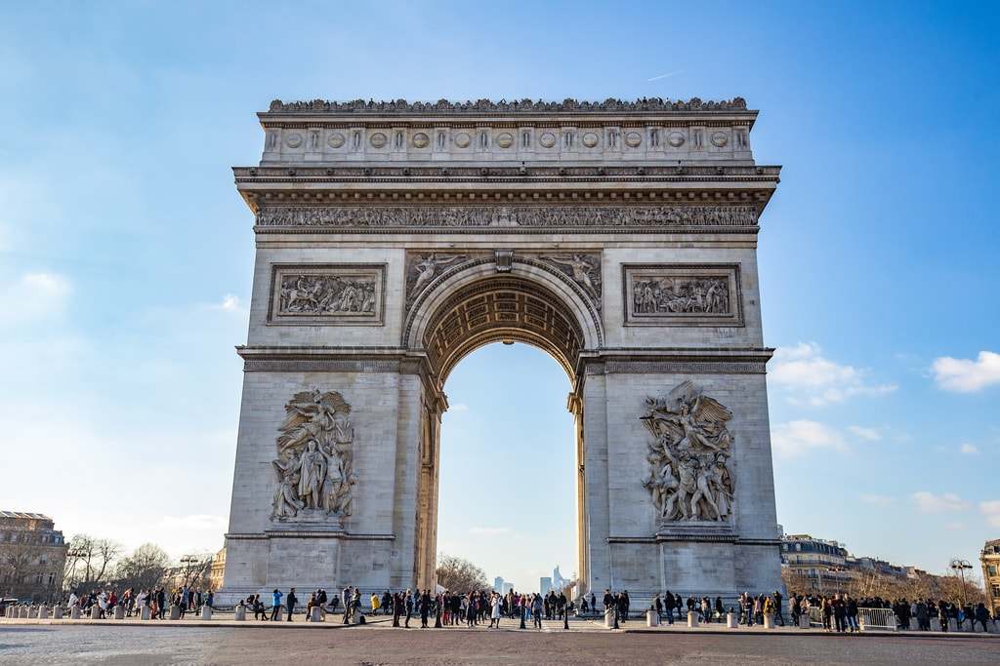

Answer: The image shows the Arc de Triomphe, a famous monument located in Paris, France. It is one of the most well-known landmarks in the city and stands at the western end of the Champs-Élysées. The Arc de Triomphe honors those who fought and died for France in the French Revolutionary and Napoleonic Wars, with the names of all French victories and generals inscribed on its inner and outer surfaces.

**********  Result request-2 ********** 

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/office.jpg


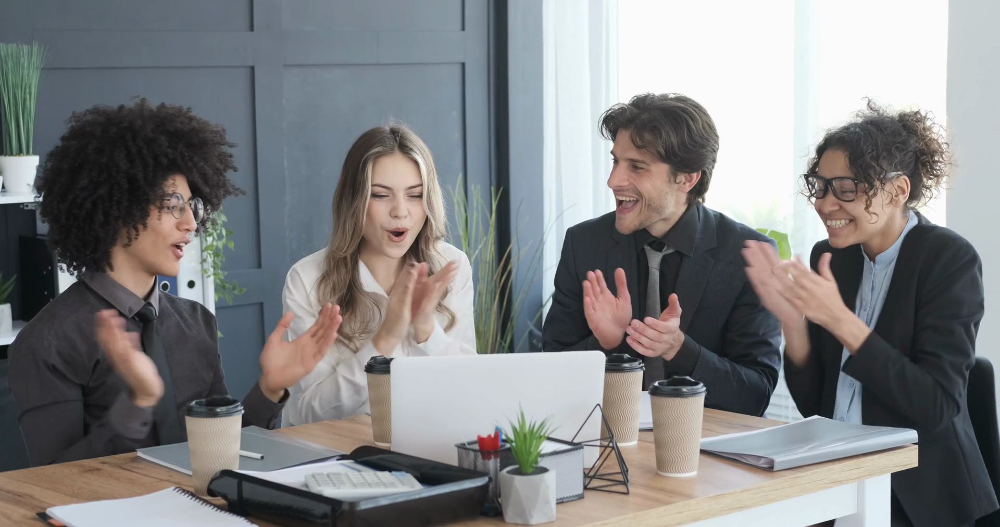

Answer: The image shows a group of people sitting around a table in a professional setting. They are clapping and appear to be having a productive and positive meeting or discussion. On the table, there are open notebooks, coffee cups, a laptop, a small plant, pens, and other office supplies. The background includes some plants and office furniture.

**********  Result request-3 ********** 

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/car2.jpg


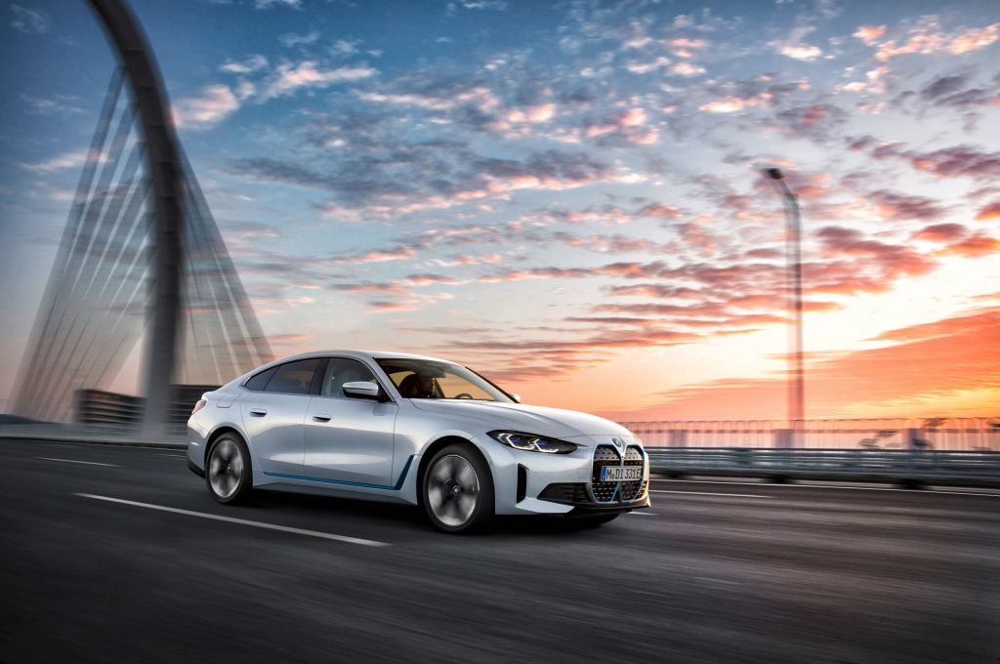

Answer: The image shows a sleek white car driving on a bridge during a beautiful sunset. The car has dynamic lines, indicating speed, and is positioned against a dramatic sky with scattered clouds. The bridge's modern design adds to the overall aesthetic appeal of the scene.

**********  Result request-4 ********** 

Image url: https://raw.githubusercontent.com/retkowsky/Azure-Computer-Vision-in-a-day-workshop/main/images/presentation.png


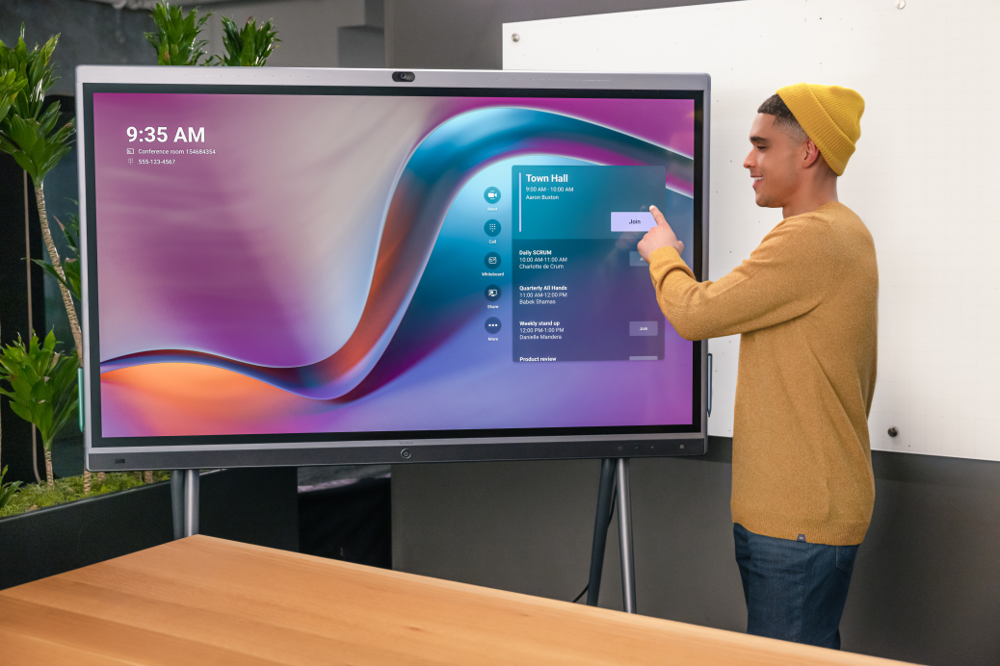

Answer: The image shows a large digital interactive display screen with a person interacting with it. The screen displays a meeting schedule, including times, meeting names, and participants with a "Join" button highlighted. On the left side of the screen, the current time (9:35 AM) and contact number for the conference room can be seen. The environment includes some green plants and a wooden table. The individual appears to be using the touch interface of the screen.



In [23]:
with open(result_file, 'r') as file:
    data = json.load(file)

# First, sort the data by custom_id
sorted_data = sorted(data, key=lambda x: x["custom_id"])

# Print the results in alphabetical order of custom_id
for imageurl, item in zip(images_urls, sorted_data):
    customid = item["custom_id"]
    result = item["response"]["body"]["choices"][0]["message"]["content"]
    print(f"**********  Result {customid} ********** \n")
    response = requests.get(imageurl)
    print(f"Image url: {imageurl}")
    display(Image.open(BytesIO(response.content)))
    print(f"\033[1;31;34mAnswer: {result}\n\033[0m")